### Hourly Energy Consumption

American Electric Power Company : Major investor-owned electric utility in the United States, delivering electricity to more than five million customers in 11 states.

Commonwealth Edison (ComEd) : the largest electric utility in Illinois, and the primary electric provider in Chicago and much of Northern Illinois.

The Dayton Power and Light Company  : generates electricity for, a customer base of over 500,000 people within a 6,000-square-mile (16,000 km2) area of West Central Ohio

In [1]:
import pandas as pd
import math
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import xgboost as xgb
import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px
from plotly.subplots import make_subplots
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
from prophet.plot import plot_plotly, plot_components_plotly
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
import tensorflow as tf

In [2]:
pjme_df = pd.read_csv('PJME_hourly.csv',  parse_dates=['Datetime'] , index_col=['Datetime']).sort_values('Datetime')
pjme_df.head()
pjme_df.head()

,PJME_MW
Datetime,
2002-01-01 01:00:00,30393.0
2002-01-01 02:00:00,29265.0
2002-01-01 03:00:00,28357.0
2002-01-01 04:00:00,27899.0
2002-01-01 05:00:00,28057.0


Text(0.5, 1.0, 'Hourly Energy Consumption PJME ')

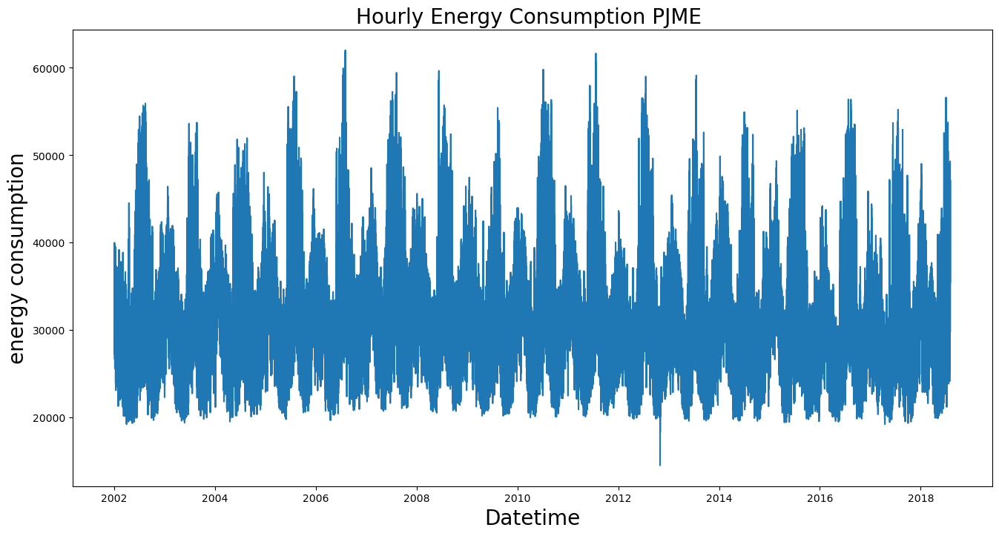

In [3]:
plt.figure(figsize=(16,8))
plt.plot(pjme_df)
plt.xlabel('Datetime',size = 20)
plt.ylabel('energy consumption',size= 20)
plt.title('Hourly Energy Consumption PJME ' , size =20)

## 1. EDA

In [24]:
# # Defining Scatter Plot Data :
# data = go.Scatter ( x = pjme_df.index,
#                     y = pjme_df['PJME_MW'],
#                     mode = 'lines',
#                     name = 'PJME')

# # Defining Layout:
# layout = go.Layout(title={'text': 'American Electric Power'},
#                     xaxis = dict(title = 'Year'),
#                     yaxis = dict(title = 'PJME_MW'),
#                     template = 'seaborn')

# fig = go.Figure(data = data, layout = layout)
# iplot(fig)

In [23]:
# fig = px.line(pjme_df, x='date', y='PJME_MW', 
#               title='American Electric Power with Range Slider and Selectors',
#               template='seaborn' 
#              )

# fig.update_xaxes(
#     rangeslider_visible=True,
#     rangeselector=dict(
#         buttons=list([
#             dict(count=1, label="1m", step="month", stepmode="backward"),
#             dict(count=6, label="6m", step="month", stepmode="backward"),
#             dict(count=1, label="YTD", step="year", stepmode="todate"),
#             dict(count=1, label="1y", step="year", stepmode="backward"),
#             dict(step="all")
#         ])
#     )
# )
# fig.show()

In [3]:
def time_features (data , label) :
    data['hour']  = data.index.hour
    data['month'] = data.index.month
    data['year']  = data.index.year
    data['day']  = data.index.day
    data['dayofweek'] = data.index.dayofweek
    data['season'] = data.index.quarter
    data['weekday_name'] = data.index.day_name()
    data['month_name'] = data.index.strftime('%B')  # Extracting month name



    
    X = data[['hour','day','month','year','dayofweek','season','weekday_name']]
    Y = data[label]
    return data



In [51]:
pjme_hourly = time_features(pjme_df,label='PJME_MW')
pjme_hourly

,PJME_MW,hour,month,year,day,dayofweek,season,weekday_name,month_name
Datetime,,,,,,,,,
2002-01-01 01:00:00,30393.0,1,1,2002,1,1,1,Tuesday,January
2002-01-01 02:00:00,29265.0,2,1,2002,1,1,1,Tuesday,January
2002-01-01 03:00:00,28357.0,3,1,2002,1,1,1,Tuesday,January
2002-01-01 04:00:00,27899.0,4,1,2002,1,1,1,Tuesday,January
2002-01-01 05:00:00,28057.0,5,1,2002,1,1,1,Tuesday,January
...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,20,8,2018,2,3,3,Thursday,August
2018-08-02 21:00:00,43256.0,21,8,2018,2,3,3,Thursday,August
2018-08-02 22:00:00,41552.0,22,8,2018,2,3,3,Thursday,August


In [22]:
# scatter_hour = go.Scatter( x = pjme_hourly['hour'],
#             y =pjme_hourly['PJME_MW'] ,
#             mode = 'markers' ,
#             marker = dict(color = pjme_hourly['PJME_MW'],
#                                     showscale = True,
#                                    colorscale = 'OrRd',
#                                    colorbar = dict(title='PJME_MW'),
#                                     size = 9,
#                                     opacity = 0.55))

# layout_hour =go.Layout(title={'text': 'American Electric Power consumption by hour of day'},
#                     xaxis = dict(title = 'Hour'),
#                     yaxis = dict(title = 'PJME_MW'),
#                     template = 'seaborn')

# fig = go.Figure(data = scatter_hour , layout = layout_hour)
# iplot(fig)


In [21]:
# marker_day = go.Scatter ( x = pjme_hourly['dayofweek'] , 
#                          y = pjme_hourly['PJME_MW'],
#                          mode = 'markers' ,
#                          marker = dict(color = pjme_hourly['PJME_MW'],
#                                     showscale = True,
#                                    colorscale = 'OrRd',
#                                    colorbar = dict(title='PJME_MW'),
#                                     size = 9,
#                                     opacity = 0.55))

# layout_day = go.Layout (title={'text': 'American Electric Power consumption by day'},
#                     xaxis = dict(title = 'Day'),
#                     yaxis = dict(title = 'PJME_MW'),
#                     template = 'seaborn')

# fig = go.Figure (marker_day , layout_day)
# iplot(fig)

In [ ]:
sns.pairplot(pjme_hourly,
             hue ='hour',
             y_vars='PJME_MW',
             x_vars=['year','season'],
             height=5,
             plot_kws={'alpha':0.15, 'linewidth':0})
            
plt.suptitle('Power Use MW by Hour, Day of Week, Year and Season')
plt.show()


In [87]:


# box_spring = go.Box(x = pjme_hourly.loc[pjme_hourly['season']==1]['hour'],
#                     y = pjme_hourly.loc[pjme_hourly['season']==1]['PJME_MW'],
#                     marker_color='green')

# box_summer = go.Box(x = pjme_hourly.loc[pjme_hourly['season']==2]['hour'],
#                     y = pjme_hourly.loc[pjme_hourly['season']==2]['PJME_MW'],
#                     marker_color='red')

# box_fall = go.Box(  x = pjme_hourly.loc[pjme_hourly['season']==3]['hour'],
#                     y = pjme_hourly.loc[pjme_hourly['season']==3]['PJME_MW'],
#                     marker_color='orange')


# box_winter = go.Box(x = pjme_hourly.loc[pjme_hourly['season']==4]['hour'],
#                     y = pjme_hourly.loc[pjme_hourly['season']==4]['PJME_MW'],
#                     marker_color='blue')



# fig = make_subplots(rows=2, cols=2 , subplot_titles=("Spring", "Summer", "Fall", "Winter"))
# fig.add_trace(box_spring, row=1, col=1)
# fig.add_trace(box_summer, row=1, col=2)
# fig.add_trace(box_fall, row=2, col=1)
# fig.add_trace(box_winter, row=2, col=2)



# # Update layout
# fig.update_layout(
#     title="American electric power consumption in Different Season",
#     xaxis=dict(title="Hour"),
#     yaxis=dict(title="PJME"),
#     template='plotly_dark'
# )


# iplot(fig)


In [86]:
pjme_hourly.loc[pjme_hourly['season']==3]['month_name']


Datetime
2002-07-01 00:00:00      July
2002-07-01 01:00:00      July
2002-07-01 02:00:00      July
2002-07-01 03:00:00      July
2002-07-01 04:00:00      July
                        ...  
2018-08-02 20:00:00    August
2018-08-02 21:00:00    August
2018-08-02 22:00:00    August
2018-08-02 23:00:00    August
2018-08-03 00:00:00    August
Name: month_name, Length: 36121, dtype: object

In [94]:

# scatter_fall = go.Scatter( x = pjme_hourly.loc[pjme_hourly['season']==3]['month_name'],
#                            y = pjme_hourly.loc[pjme_hourly['season']==3]['PJME_MW'],
#                            mode='markers',
#                            marker = dict(color = pjme_hourly['PJME_MW'],
#                                      showscale = True,
#                                      colorscale = 'OrRd',
#                                      colorbar = dict(title='PJME_MW'),
#                                      size = 9,
#                                      opacity = 0.55))

# layout_fall = go.Layout(title={'text':'American electric power consumption in Fall'},
#                         xaxis= dict (title='Month'),
#                         yaxis= dict (title='PJME_MW') )

# fig = go.Figure(scatter_fall,layout_fall)
# iplot(fig)

In [57]:
sum_by_year = pjme_hourly['PJME_MW'].groupby(pjme_hourly['year']).sum()
sum_by_year = sum_by_year.reset_index()
sum_by_year.head(3)

,year,PJME_MW
0,2002,276420109.0
1,2003,277617728.0
2,2004,283398959.0


In [40]:
# sum_by_year = pjme_hourly['PJME_MW'].groupby(pjme_hourly['year']).sum()
# sum_by_year = sum_by_year.reset_index()

# bar_plot = go.Bar (x = sum_by_year['year'] , 
#                    y = sum_by_year['PJME_MW'],
#                    text = round (sum_by_year['PJME_MW']),
#                    textposition='outside')

# layout = go.Layout(title={'text': 'Total American electric power consumption per year',
#                               'y':0.9,
#                               'x':0.5,
#                               'xanchor': 'center',
#                               'yanchor': 'top'},
#                        xaxis = dict(title = 'Year'),
#                        yaxis = dict(title = 'PJME'),
#                        template = 'seaborn')


# fig = go.Figure(data=bar_plot,layout=layout)
# iplot(fig)

In [58]:
df_pivot = pjme_hourly.pivot_table(index=pjme_hourly['hour'], columns='weekday_name', 
            values='PJME_MW',
            aggfunc='sum')

df_pivot = df_pivot.reset_index()
df_pivot.head(3)

weekday_name,hour,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0,25932395.0,24678263.0,25640950.0,24753343.0,25998036.0,25803975.0,26017551.0
1,1,24146763.0,23125695.0,23897902.0,23173169.0,24193735.0,24064406.0,24208934.0
2,2,23099526.0,22224279.0,22778368.0,21914273.0,23149421.0,23043515.0,23172152.0


In [56]:
# Monday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Monday'],
#                   mode = 'lines',
#                   name = 'Monday')

# Tuesday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Tuesday'],
#                   mode = 'lines',
#                   name = 'Tuesday')

# Wednesday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Wednesday'],
#                   mode = 'lines',
#                   name = 'Wednesday')

# Thursday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Thursday'],
#                   mode = 'lines',
#                   name = 'Thursday')

# Friday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Friday'],
#                   mode = 'lines',
#                   name = 'Friday')

# Saturday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Saturday'],
#                   mode = 'lines',
#                   name = 'Saturday')

# Sunday = go.Scatter(x = df_pivot['hour'],
#                   y = df_pivot['Sunday'],
#                   mode = 'lines',
#                   name = 'Sunday')

# layout = go.Layout(title={'text': 'American electric power consumption - hourly trends',
#                           'y':0.9,
#                           'x':0.5,
#                           'xanchor': 'center',
#                           'yanchor': 'top'},
#                    xaxis = dict(title = 'Hour'),
#                    yaxis = dict(title = 'PJME'),
#                    template = 'plotly_dark')

# fig = go.Figure(data = [Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, Sunday],
#               layout = layout)
# iplot(fig)

## 2. Split Data(Train/Test)
Time-based splitting involves partitioning your time series data into two segments: a training set and a test set. The training set consists of observations from the earlier time periods, while the test set contains observations from later time periods.    
If you're working with time series data, random splitting might not be the best approach. Instead, you should consider using a time-based split, where you train on earlier data and test on later data. This ensures that your model is evaluated on unseen future data, which better simulates real-world deployment scenarios.

#### First method : 
Sorting the DataFrame by the timestamp column ensures that the data is arranged in the correct temporal order, with earlier observations appearing before later ones. 

In [3]:
df_sorted = pjme_df.sort_values(by='Datetime')
split_size = int(len(df_sorted)*0.75)
pjme_train_sorted = df_sorted[:split_size]
pjme_test_sorted = df_sorted[split_size:]

#### Second method : 
We can define the splitting date. In this case, we set a split_date e.g. '05-Jan-2017'. This date is used to divide the dataset into training and test sets, with observations on or before this date considered as training data, and observations after this date considered as test data.

In [52]:
pjme_df

,PJME_MW,hour,month,year,day,dayofweek,season,weekday_name,month_name
Datetime,,,,,,,,,
2002-01-01 01:00:00,30393.0,1,1,2002,1,1,1,Tuesday,January
2002-01-01 02:00:00,29265.0,2,1,2002,1,1,1,Tuesday,January
2002-01-01 03:00:00,28357.0,3,1,2002,1,1,1,Tuesday,January
2002-01-01 04:00:00,27899.0,4,1,2002,1,1,1,Tuesday,January
2002-01-01 05:00:00,28057.0,5,1,2002,1,1,1,Tuesday,January
...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,20,8,2018,2,3,3,Thursday,August
2018-08-02 21:00:00,43256.0,21,8,2018,2,3,3,Thursday,August
2018-08-02 22:00:00,41552.0,22,8,2018,2,3,3,Thursday,August


In [4]:
split_date = '01-Jan-2016'
pjme_train = pjme_df.loc[pjme_df.index <= split_date]
pjme_test  = pjme_df.loc[pjme_df.index > split_date]
print(f'shape of train data is {pjme_train.shape}')
print(f'shape of test data is {pjme_test.shape}')

shape of train data is (122687, 1)
shape of test data is (22679, 1)


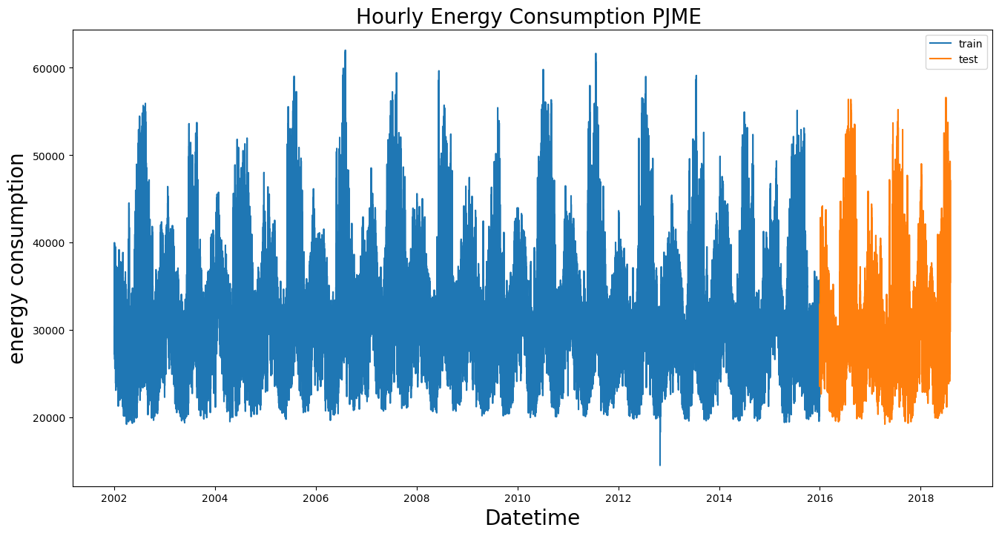

In [4]:
plt.figure(figsize=(16,8))
plt.plot(pjme_train , label = 'train')
plt.plot(pjme_test,label = 'test')
plt.xlabel('Datetime',size = 20)
plt.ylabel('energy consumption',size= 20)
plt.title('Hourly Energy Consumption PJME ' , size =20)
plt.legend()
plt.show()

# Facebook's prophet to forecast hourly energy use.

We use a decomposable time series model with three main model components: trend, seasonality, and holidays. They are combined in the following equation:      

y(t) = g(t) + s(t) + h(t) + e(t)       

here,      

g(t) refers to trend (changes over a long period of time) 

s(t) refers to seasonality (periodic or short-term changes)  

h(t) refers to effects of holidays to the forecast

e(t) refers to the unconditional changes that is specific to a business or a person or a circumstance. It is    also called the error term.   

y(t) is the forecast.   

1. Trend is modelled by fitting a piece wise linear curve or Logistic Growth Model :    
(however, newer models can be written or extended according to specific requirements.)    

i. Logistic Growth Model : If the data to be forecasted, has saturating and non-linear data (grows non-linearly and after reaching the saturation point, shows little to no growth or shrink and only exhibits some seasonal changes), then logistic growth model is the best option.     

ii. Piece-Wise Linear Model1 : if the data shows linear properties and had growth or shrink trends in the past then, the piece-wise linear model is a better choice.     

By default, Prophet uses a piece-wise linear model, but it can be changed by specifying the model.


2. To fit and forecast the effects of seasonality, prophet relies on fourier series to provide a flexible model.

### Prophet in action 


Facebook Prophet predicts data only when it is in a certain format. The dataframe with the data should have a column saved as ds for time series data and y for the data to be forecasted.

In [5]:
model_prophet = Prophet()
# Prophet takes a specific format of data that is not datetime it is 'ds'. We must convert our data back to datetime.
model_prophet.fit(pjme_train.reset_index().rename(columns={'Datetime':'ds' , 'PJME_MW':'y'}))
df_predict = model_prophet.predict(pjme_test.reset_index().rename(columns={'Datetime':'ds'}))
df_predict['y'] = pjme_test.reset_index()['PJME_MW']

12:07:31 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing


In [6]:
df_predict.head(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,y
0,2016-01-01 01:00:00,31219.982650,23300.884769,32168.821508,31219.982650,31219.982650,-3283.859107,-3283.859107,-3283.859107,-4410.540792,...,924.208117,924.208117,202.473568,202.473568,202.473568,0.0,0.0,0.0,27936.123542,25509.0
1,2016-01-01 02:00:00,31219.951251,21396.247093,30984.118109,31219.951251,31219.951251,-4784.514573,-4784.514573,-4784.514573,-5899.585110,...,910.158603,910.158603,204.911934,204.911934,204.911934,0.0,0.0,0.0,26435.436678,24599.0
2,2016-01-01 03:00:00,31219.919851,21162.588028,30210.545574,31219.919851,31219.919851,-5656.758463,-5656.758463,-5656.758463,-6758.875407,...,894.726136,894.726136,207.390809,207.390809,207.390809,0.0,0.0,0.0,25563.161389,23896.0


/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/prophet/plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/prophet/plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



(16801.0, 17746.0)

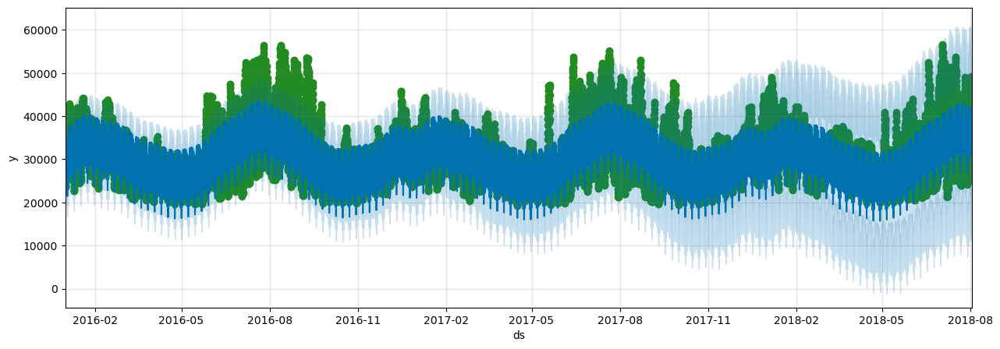

In [9]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(pjme_test.index, pjme_test['PJME_MW'], color='ForestGreen')
fig = model_prophet.plot(df_predict, ax=ax)
ax.set_xlim(pd.Timestamp('2016-01-01'), pd.Timestamp('2018-08-03'))  # zoom in test data


/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/prophet/plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/prophet/plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



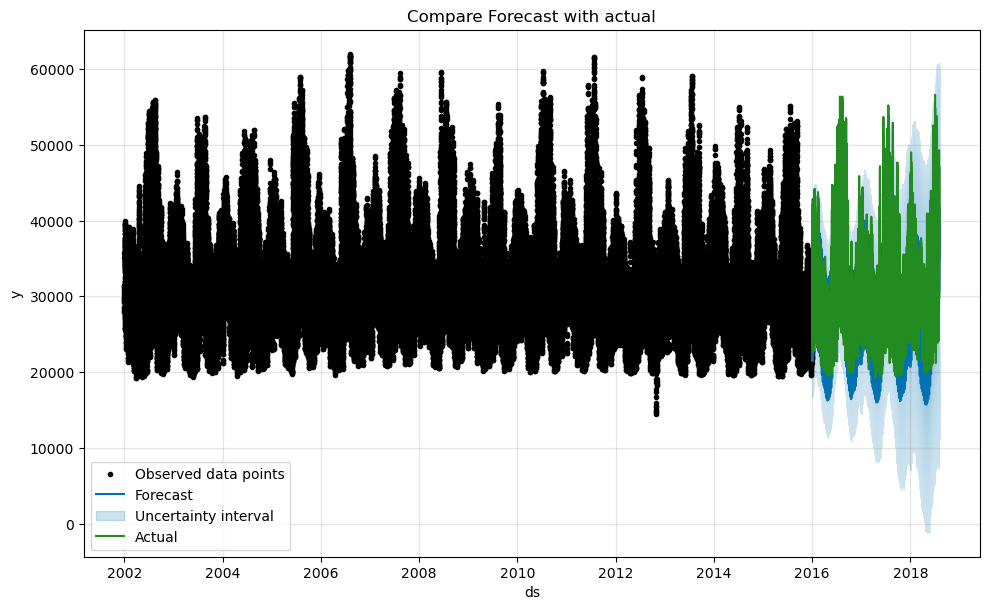

In [12]:
model_prophet.plot(df_predict, include_legend=True)
plt.plot(df_predict['ds'], df_predict['y'], color='ForestGreen', label='Actual')
plt.title('Compare Forecast with actual')
plt.legend()
plt.show()

In [93]:
plot_components_plotly(model_prophet,df_predict)

The plots show the trends and seasonality which is Yearly , Weekly , and Daily of the time series data. We can see there is an no trend, meaning the number of energy consumption has remain stable over time. If we look at the seasonality graph, we can see that 
energy consumption peaks during the January for heating and during the July for air conditioning.

In [27]:
prophet_rmse = np.sqrt(mean_squared_error(df_predict['y'] , df_predict['yhat']))
prophet_mae = mean_absolute_error(df_predict['y'] , df_predict['yhat'])
print(f'mean squared error is {prophet_rmse:0.2f},and mean absolute error is {prophet_mae:0.2f}')

mean squared error is 4091.56,and mean absolute error is 3120.48


### Adding Holiday 

In [83]:
model_prophet_holidays = Prophet()
model_prophet_holidays.add_country_holidays(country_name='USA')
model_prophet_holidays.fit(pjme_train.reset_index().rename(columns={'Datetime':'ds' , 'PJME_MW':'y'}))

df_predict_holiday = model_prophet_holidays.predict(pjme_test.reset_index().rename(columns={'Datetime':'ds'}))
df_predict_holiday['y'] = pjme_test.reset_index()['PJME_MW']

15:22:24 - cmdstanpy - INFO - Chain [1] start processing
15:22:52 - cmdstanpy - INFO - Chain [1] done processing


In [80]:
model_prophet_holidays.train_holiday_names.to_list()

["New Year's Day",
 'Memorial Day',
 'Independence Day',
 'Labor Day',
 'Veterans Day',
 'Thanksgiving',
 'Christmas Day',
 'Christmas Day (observed)',
 'Martin Luther King Jr. Day',
 "Washington's Birthday",
 'Columbus Day',
 "New Year's Day (observed)",
 'Independence Day (observed)',
 'Veterans Day (observed)']

In [89]:
plot_components_plotly(model_prophet_holidays,df_predict_holiday)

In [103]:
prophet_holiday_rmse = np.sqrt(mean_squared_error(df_predict_holiday['y'] , df_predict_holiday['yhat']))
prophet_holiday_mae = mean_absolute_error(df_predict_holiday['y'] , df_predict_holiday['yhat'])
print(f'mean squared error is {prophet_rmse:0.2f},and mean absolute error is {prophet_mae:0.2f}')

mean squared error is 4067.79,and mean absolute error is 3103.80


# XGBoost

In [ ]:
import xgboost as xgb
split_date = '01-Jan-2016'
pjme_train = pjme_df.loc[pjme_df.index <= split_date]
pjme_test  = pjme_df.loc[pjme_df.index > split_date]

train = time_features(pjme_train , label='PJME_MW')
test = time_features(pjme_test , label='PJME_MW')
test.head(5)

In [47]:
x_train = train[['hour','month','year',	'day','dayofweek','season']]
y_train = train['PJME_MW']
x_test = test[['hour','month','year','day','dayofweek','season' ]]
y_test = test['PJME_MW']

In [48]:
model_xgboost = xgb.XGBRegressor(n_estimators = 1000)
model_xgboost.fit(x_train,y_train , 
                  eval_set = [(x_train,y_train),(x_test,y_test)] ,
                  early_stopping_rounds=50,
                  verbose=False)


/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

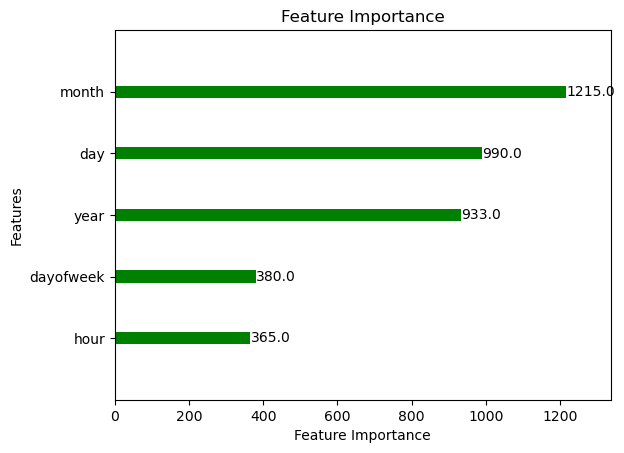

In [49]:
xgb.plot_importance(model_xgboost, height=0.2, color='green', xlabel='Feature Importance', ylabel='Features', title='Feature Importance', grid=False, linewidth=3)
plt.show()


In [58]:
test['prediction']=model_xgboost.predict(x_test)
mse_xgboost = np.sqrt ( mean_squared_error(y_true=test['PJME_MW'] , y_pred=test['prediction']) )
mae_xgboost = mean_absolute_error ( y_true=test['PJME_MW'] , y_pred=test['prediction'])

/var/folders/76/1yzscp4d71l1rljcgf5sbbfm0000gn/T/ipykernel_37078/1501966839.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
test['error'] = test['PJME_MW']-test['prediction']
test.groupby(['year' , 'month','day']).sum()[['PJME_MW' , 'prediction' ,'error']]


/var/folders/76/1yzscp4d71l1rljcgf5sbbfm0000gn/T/ipykernel_37078/2342956414.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



PJME_MW     prediction          error
year month day                                        
2016 1     1    644065.0  785535.562500 -141470.535156
           2    696432.0  803427.937500 -106995.933594
           3    698803.0  781432.312500  -82629.310547
           4    821012.0  852556.125000  -31544.148438
           5    918751.0  880710.375000   38040.619141
...                  ...            ...            ...
2018 7     30   790978.0  908322.250000 -117344.263672
           31   828938.0  912382.250000  -83444.261719
     8     1    941539.0  891737.437500   49801.541016
           2    950233.0  875254.375000   74978.611328
           3     35486.0   32847.605469    2638.394531

[946 rows x 3 columns]

# Long Short-Term Memory (LSTM) Networks 

#### Prepare data (Normalization)

In [59]:
from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# scaled_data = scaler.fit_transform(pjme_df['PJME_MW'].values.reshape(-1,1))
# scaled_data

### Turn data into windows and horizons

In [3]:
def sliding_window (window_size , data):
    windows , labels = [] , []
    for i in range(window_size , len (data)):
        windows.append(data[i-window_size:i , 0])
        labels.append(data[i,0])
    windows , labels = np.array(windows) , np.array(labels) 
    return windows , labels


After filling our lists, we convert them to NumPy arrays. then we reshape x_train so that x_train can work with the neural network.

In [4]:
full_windows , full_labels = sliding_window(window_size = 3, data = pjme_df.values)
print(full_windows.shape)
print(full_labels.shape)
len(full_windows) ,len(full_labels)       

(145363, 3)
(145363,)


(145363, 145363)

### Turning windows into training and test sets

We could've windowed our existing training and test splits, however, with the nature of windowing (windowing often requires an offset at some point in the data), it usually works better to window the data first, then split it into training and test sets. Let's write code which takes in full sets of windows and their labels and splits them into train and test splits.



In [5]:
split_size = int (len(full_windows)*0.8)
train_windows = full_windows[:split_size]
train_labels = full_labels[:split_size]

test_windows = full_windows[split_size:]
test_labels = full_labels[split_size:]

len(train_windows),len(train_labels),len(test_windows),len(test_labels)

(116290, 116290, 29073, 29073)

### Build Model

In [25]:
tf.random.set_seed(7)
model_lstm = Sequential()
model_lstm.add (LSTM(units = 50, activation='relu',return_sequences=True ,input_shape = (full_windows.shape[1],1) ))
model_lstm.add (LSTM(units = 128 ,activation='relu',return_sequences=True))
model_lstm.add (LSTM(units =128, activation='relu', return_sequences=False))
# model_lstm.add (Dropout(0.2))
model_lstm.add (Dense(units= 1))

model_lstm.compile(optimizer='adam' , loss='mae' ,metrics=['mse'])
history_lstm = model_lstm.fit(train_windows,train_labels , epochs=10 , batch_size=32 , validation_data=(test_windows,test_labels) )

Epoch 1/10
3635/3635 [==============================] - 17s 4ms/step - loss: 2867.8755 - mse: 25210660.0000 - val_loss: 1061.3802 - val_mse: 1844295.0000
Epoch 2/10
3635/3635 [==============================] - 16s 4ms/step - loss: 639.2357 - mse: 820506.6875 - val_loss: 408.2917 - val_mse: 380789.7188
Epoch 3/10
3635/3635 [==============================] - 15s 4ms/step - loss: 516.0234 - mse: 575470.7500 - val_loss: 416.6179 - val_mse: 365608.7500
Epoch 4/10
3635/3635 [==============================] - 15s 4ms/step - loss: 497.1592 - mse: 544881.6875 - val_loss: 438.9973 - val_mse: 369457.2812
Epoch 5/10
3635/3635 [==============================] - 16s 4ms/step - loss: 483.9466 - mse: 525007.0625 - val_loss: 394.0895 - val_mse: 367409.1562
Epoch 6/10
3635/3635 [==============================] - 16s 4ms/step - loss: 490.6721 - mse: 544562.4375 - val_loss: 405.6934 - val_mse: 343917.3125
Epoch 7/10
3635/3635 [==============================] - 15s 4ms/step - loss: 484.1191 - mse: 522355.0

In [32]:
#  evaluate on test data
evaluate_test = model_lstm.evaluate(test_windows,test_labels)
print(f'Mean absolute error  {evaluate_test[0]:.2f}\nMean square error  { round(np.sqrt(evaluate_test[1] )) }')

# history_df = pd.DataFrame(history_lstm.history)
# history_df.head(5)


909/909 [==============================] - 1s 1ms/step - loss: 451.0797 - mse: 383316.1562
Mean absolute error  451.08
Mean square error  619


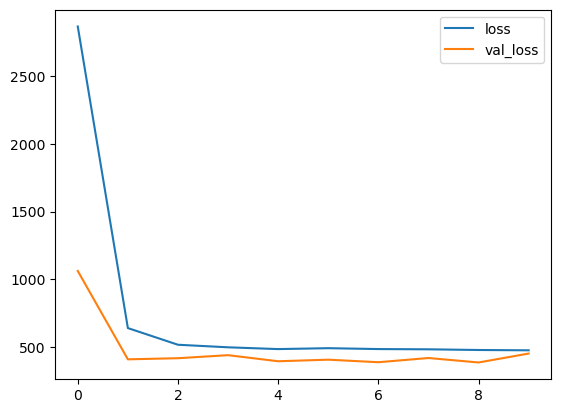

In [27]:
history_df = pd.DataFrame(history_lstm.history)
plt.plot(history_df['loss'] , label = 'loss')
plt.plot(history_df['val_loss'] ,label = 'val_loss')
plt.legend()
plt.show()

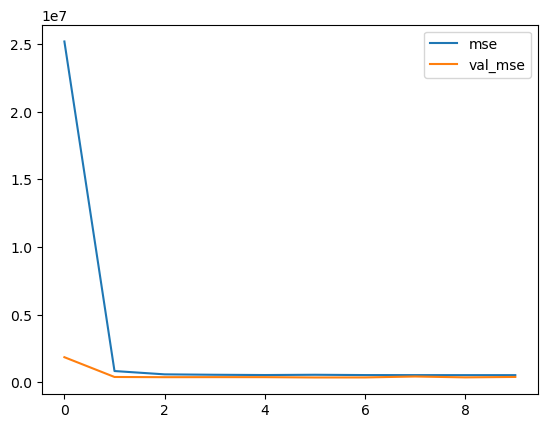

In [28]:
plt.plot(history_df['mse'],label= 'mse')
plt.plot(history_df['val_mse'] , label ='val_mse')
plt.legend()
plt.show()

In [ ]:
data = { 'Model' : ['FB Prophet' ,' FB Prophet Holiday','XGBoost' , 'LSTM'],
        'MAE' : [prophet_mae , prophet_holiday_mae , mae_xgboost , evaluate_test[0]] ,
        'MSE' : [prophet_rmse , prophet_holiday_rmse , mse_xgboost , evaluate_test[1]]}